In [7]:
import ipyleaflet
import matplotlib.pyplot as plt
import numpy as np
import pystac_client
import shapely
import stacmap

from IPython.display import Image
from odc.stac import load
from shapely import Polygon
from shapely.geometry import box
from tqdm import tqdm
from typing import List

import odc.stac

In [8]:
client = pystac_client.Client.open("https://earth-search.aws.element84.com/v1")

In [9]:
collections = list(client.get_collections())
n_collections = len(collections)

In [10]:
print(f"There are {n_collections} collections:\n")
for c in collections:
    print(c.id)

There are 9 collections:

sentinel-2-pre-c1-l2a
cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


In [11]:
collection = "sentinel-2-l2a"
date="2024-06-01/2024-08-31"

In [142]:
m = ipyleaflet.Map()
m.center = 54.15, -128.1
m.zoom = 9
m.layout.height = "300px"
m.layout.width = "500px"
m

Map(center=[54.15, -128.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_…

In [143]:
#lon, lat = -127.650631, 54.064817
#bbox = (lon-0.5, lat-0.25, 
#        lon+0.5, lat+0.25) # min lon,lat, max lon, lat
bbox=[m.west, m.south, m.east, m.north]

In [144]:
%%time
items_t1 = client.search(collections=[collection], 
                         datetime=date,
                         bbox=bbox,
                         #intersects=dict(type="Point", coordinates=[lon, lat]),
                         query=["s2:nodata_pixel_percentage<10",
                                "s2:degraded_msi_data_percentage<10",
                                "eo:cloud_cover<20"])

CPU times: user 2.79 ms, sys: 19.1 ms, total: 21.9 ms
Wall time: 41.2 ms


In [145]:
items_t1

In [146]:
n_items_t1 = len(items_t1.item_collection())
n_items_t1

32

In [147]:
print(f"{items_t1.matched()} items found:\n")
for item in items_t1.items():
    area = np.round(
        Polygon(*item.geometry['coordinates']).area,
        2)
    print(item.id,":",
          item.properties['eo:cloud_cover'],
          item.properties['s2:nodata_pixel_percentage'],
          item.properties['s2:degraded_msi_data_percentage'],
          area)


32 items found:

S2B_9UWV_20240831_0_L2A : 4.714158 0 0.0052 1.64
S2B_9UXV_20240831_0_L2A : 0.907689 5.813856 0.0212 1.54
S2B_9UXA_20240831_0_L2A : 7.466117 0 0.019 1.67
S2B_9UXV_20240828_0_L2A : 18.110819 0 0.0213 1.64
S2B_9UXV_20240818_0_L2A : 11.661033 0 0.0234 1.64
S2B_9UXA_20240818_0_L2A : 11.491711 0.386561 0.0226 1.67
S2B_9UXV_20240811_0_L2A : 6.031282 5.764032 0.0221 1.54
S2B_9UXA_20240811_0_L2A : 6.576245 0 0.0189 1.67
S2B_9UXV_20240808_0_L2A : 9.476256 0 0.0354 1.64
S2B_9UXA_20240808_0_L2A : 13.684654 0.330397 0.0504 1.67
S2A_9UWV_20240806_0_L2A : 9.66675 0 0 1.64
S2A_9UXV_20240806_0_L2A : 17.374523 5.079705 0.0238 1.55
S2A_9UWA_20240806_0_L2A : 3.497553 0 0 1.67
S2A_9UXA_20240806_0_L2A : 15.502106 0 0.0219 1.67
S2A_9UXV_20240803_0_L2A : 0.627009 0 0.0014 1.64
S2A_9UXA_20240803_0_L2A : 6e-05 0.370785 0.0058 1.67
S2B_9UWV_20240801_0_L2A : 15.097077 0 0.0057 1.64
S2B_9UXV_20240801_0_L2A : 0.438869 4.997565 0.021 1.55
S2B_9UXA_20240801_0_L2A : 15.989015 0 0.0185 1.67
S2A_9UXV_20

In [148]:
min_cloud_t1 = min(items_t1.items(),
                   key=lambda item: 
                   item.properties["eo:cloud_cover"])

In [149]:
min_cloud_t1

<Item id=S2A_9UXA_20240803_0_L2A>

In [150]:
Image(url=min_cloud_t1.assets["thumbnail"].href, width=400)

In [154]:
assets = min_cloud_t1.assets.items()
for key,title in assets:
    print(key,'|',title.title)

aot | Aerosol optical thickness (AOT)
blue | Blue (band 2) - 10m
coastal | Coastal aerosol (band 1) - 60m
granule_metadata | None
green | Green (band 3) - 10m
nir | NIR 1 (band 8) - 10m
nir08 | NIR 2 (band 8A) - 20m
nir09 | NIR 3 (band 9) - 60m
red | Red (band 4) - 10m
rededge1 | Red edge 1 (band 5) - 20m
rededge2 | Red edge 2 (band 6) - 20m
rededge3 | Red edge 3 (band 7) - 20m
scl | Scene classification map (SCL)
swir16 | SWIR 1 (band 11) - 20m
swir22 | SWIR 2 (band 12) - 20m
thumbnail | Thumbnail image
tileinfo_metadata | None
visual | True color image
wvp | Water vapour (WVP)
aot-jp2 | Aerosol optical thickness (AOT)
blue-jp2 | Blue (band 2) - 10m
coastal-jp2 | Coastal aerosol (band 1) - 60m
green-jp2 | Green (band 3) - 10m
nir-jp2 | NIR 1 (band 8) - 10m
nir08-jp2 | NIR 2 (band 8A) - 20m
nir09-jp2 | NIR 3 (band 9) - 60m
red-jp2 | Red (band 4) - 10m
rededge1-jp2 | Red edge 1 (band 5) - 20m
rededge2-jp2 | Red edge 2 (band 6) - 20m
rededge3-jp2 | Red edge 3 (band 7) - 20m
scl-jp2 | Sce

In [155]:
selected_bands = ["nir","red","green","blue"]

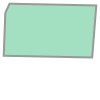

In [157]:
min_cloud_t1_poly = Polygon(*min_cloud_t1.geometry['coordinates'])
min_cloud_t1_poly

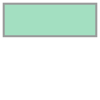

In [158]:
bbox_poly = box(*bbox)
bbox_poly

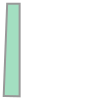

In [159]:
intersection_poly = shapely.intersection(
    bbox_poly,
    min_cloud_t1_poly)

intersection_poly

In [160]:
data_t1 = load([min_cloud_t1], 
               bands = selected_bands,
               bbox=intersection.bounds,
               resolution=10,
               progress=tqdm).isel(time=0)

100%|█████████████████████████████████████████████████| 32/32 [00:46<00:00,  1.45s/it]


In [161]:
# Code from https://gis.stackexchange.com/questions/480666/how-to-convert-sentinel-2-rgb-bands-to-0-255
def sentinel2_l2a_to_rgb(image):
    min_val = 0.0
    max_val = 0.3
    rgb_image = (image / 10000 - min_val) / (max_val - min_val)
    rgb_image[rgb_image < 0] = 0
    rgb_image[rgb_image > 1] = 1
    return rgb_image


In [162]:
rgb_t1 = data_t1[["red", "green", "blue"]].to_array().to_numpy()
min_val = np.nanmin(rgb_t1)
max_val = np.nanmax(rgb_t1)

# Step 2: Normalize the array to range [0, 1]
normalized_rgb_t1 = sentinel2_l2a_to_rgb(rgb_t1)#(rgb_23 - min_val) / (max_val - min_val)

normalized_rgb_t1 = np.transpose(normalized_rgb_t1, (1, 2, 0))

In [163]:
normalized_rgb_t1.shape

(3221, 6314, 3)

Text(0.5, 1.0, 'NDVI')

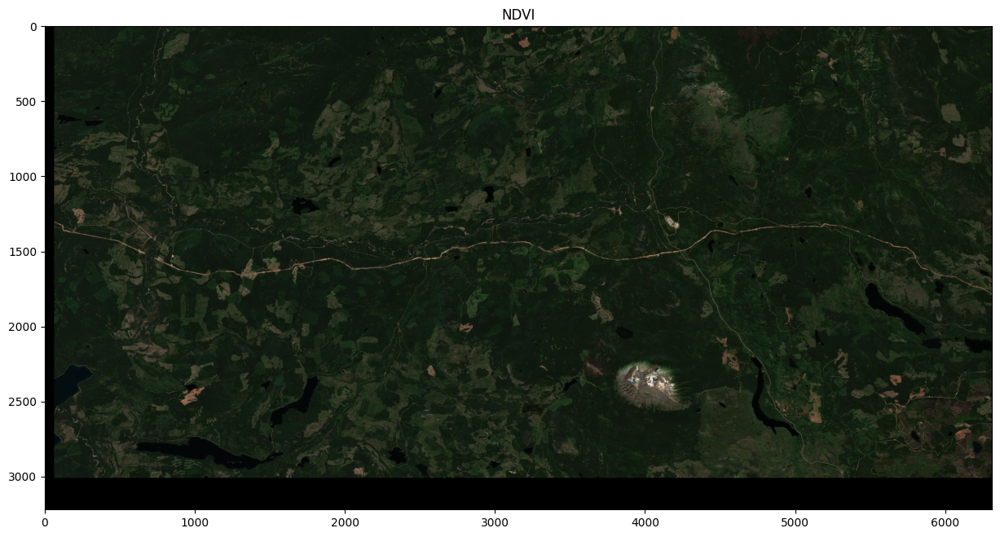

In [164]:
fig, ax = plt.subplots(figsize=(15, 15))

#ax.plot.imshow(robust=True, ax=ax)
cax = ax.imshow(normalized_rgb_t1)
ax.set_title("NDVI")

Text(0.5, 1.0, 'NDVI')

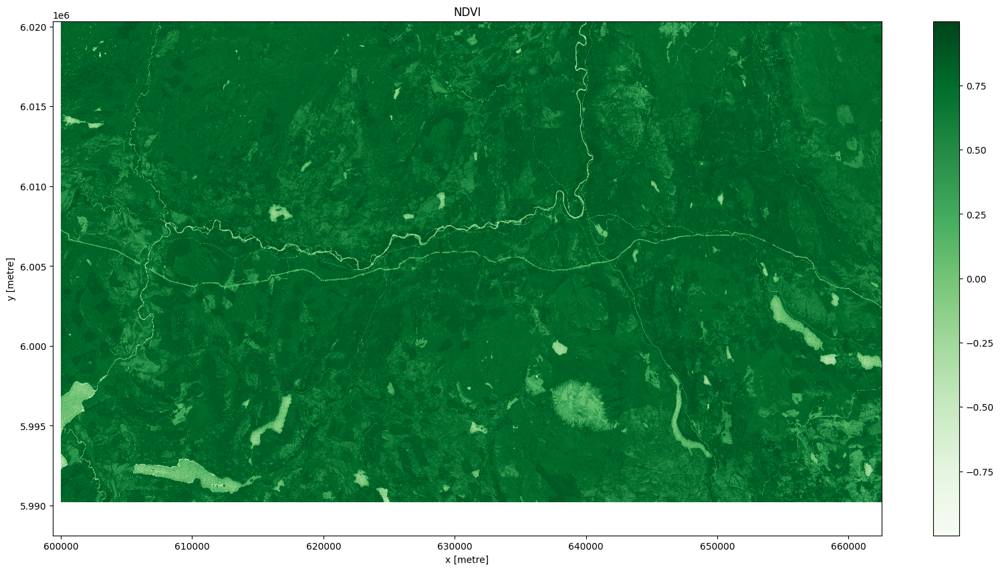

In [165]:
red = data_t1["red"].astype("float")
nir = data_t1["nir"].astype("float")
ndvi = (nir - red) / (nir + red)

fig, ax = plt.subplots(figsize=(20, 10))
ndvi.plot.imshow(ax=ax, cmap="Greens")
ax.set_title("NDVI")

In [174]:
def find_intersection_poly(item, bbox_poly):
    item_poly = Polygon(*item.geometry['coordinates'])
    return shapely.intersection(
        bbox_poly,
        item_poly)

def return_ndvi(data):
    red = data["red"].astype("float")
    nir = data["nir"].astype("float")
    ndvi = (nir - red) / (nir + red)
    return ndvi

def load_data_from_item(item, bands, bbox_poly):
    item_bbox = find_intersection_poly(item, bbox_poly)
    data = load([item], 
            bands=bands, 
            bbox=item_bbox.bounds,
            progress=tqdm).isel(time=0)
    return data

def calculate_median_ndvi(ndvis:list):
    ndvis_array = np.array([n.to_numpy() for n in ndvis])
    median_ndvi = np.nanmedian(ndvis_array, axis=0)
    return median_ndvi

def calculate_mean_ndvi_over_items(items, bands, bbox):
    n_items = len(items.item_collection())
    bbox_poly = box(*bbox)
    ndvis = []
    for idx, item in enumerate(items.items()):#tqdm(items.items(), total=n_items):
        print(f"Processing item {idx} out of {n_items}")
        data = load_data_from_item(item, bands, bbox_poly)
        ndvi = return_ndvi(data)
        ndvis.append(ndvi)
    median_ndvi = calculate_median_ndvi(ndvis)
    return median_ndvi

In [ ]:
median_ndvi_t1 = calculate_mean_ndvi_over_items(items_t1, selected_bands, bbox)

Processing item 0 out of 32


100%|█████████████████████████████████████████████████| 40/40 [00:47<00:00,  1.18s/it]


Processing item 1 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.19it/s]


Processing item 2 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.26it/s]


Processing item 3 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:05<00:00,  1.36it/s]


Processing item 4 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:08<00:00,  1.01s/it]


Processing item 5 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:09<00:00,  1.20s/it]


Processing item 6 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.18it/s]


Processing item 7 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:08<00:00,  1.10s/it]


Processing item 8 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:07<00:00,  1.12it/s]


Processing item 9 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:09<00:00,  1.20s/it]


Processing item 10 out of 32


100%|█████████████████████████████████████████████████| 40/40 [01:02<00:00,  1.55s/it]


Processing item 11 out of 32


100%|███████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.30it/s]


Processing item 12 out of 32


 60%|█████████████████████████████▍                   | 24/40 [00:49<00:43,  2.74s/it]

In [63]:
median_ndvi_t1.shape

(5626, 3379)

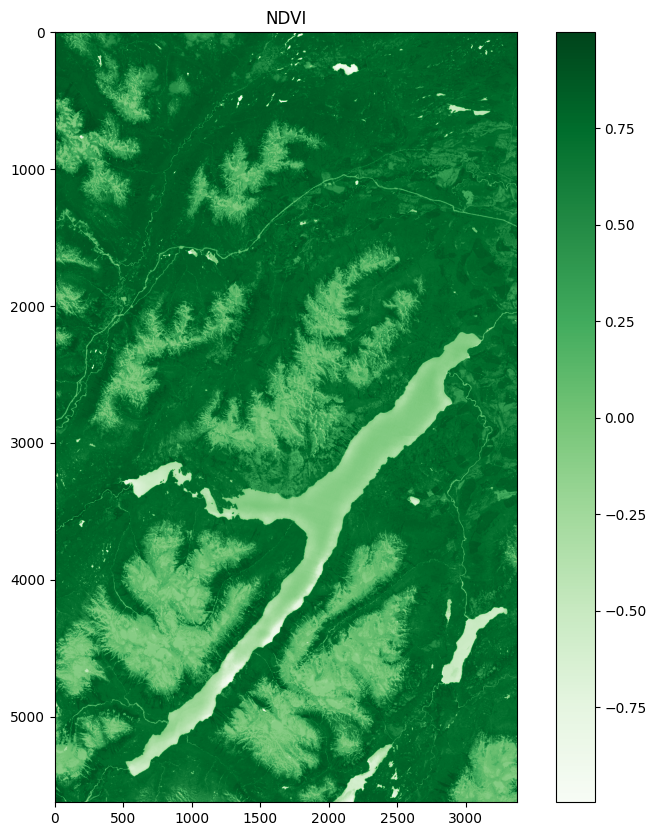

In [64]:
fig, ax = plt.subplots(figsize=(20, 10))
cax = ax.imshow(median_ndvi_t1, cmap='Greens')
ax.set_title("NDVI T1")
fig.colorbar(cax)

In [81]:
dates_2020 = "2018-06-01/2018-08-31"

In [89]:
%%time
items_2020 = client.search(
    collections=[collection], 
    datetime=dates_2020,
    intersects=dict(type="Point", coordinates=[lon, lat]),
    query=["s2:nodata_pixel_percentage<10",
           "s2:degraded_msi_data_percentage<10",
           "eo:cloud_cover<20"])

CPU times: user 2.76 ms, sys: 13.6 ms, total: 16.4 ms
Wall time: 42.5 ms


In [90]:
print(f"{items_2020.matched()} items found:\n")
for item in items_2020.items():
    print(item.id,":",
          item.properties['eo:cloud_cover'],
          item.properties['s2:nodata_pixel_percentage'])

11 items found:

S2A_9UWV_20180818_1_L2A : 2.365881 0
S2A_9UWA_20180818_1_L2A : 10.371104 0
S2A_9UWV_20180818_0_L2A : 2.157774 4.6e-05
S2A_9UWA_20180818_0_L2A : 6.820423 7e-06
S2A_9UWA_20180808_0_L2A : 10.751223 0.002532
S2B_9UWV_20180724_0_L2A : 3.85669 0.000179
S2B_9UWA_20180724_0_L2A : 8.982517 0.000169
S2B_9UWV_20180714_1_L2A : 13.224976 0
S2B_9UWA_20180714_1_L2A : 16.39262 0
S2B_9UWV_20180714_0_L2A : 8.645559 0
S2B_9UWA_20180714_0_L2A : 16.292514 0


In [91]:
median_ndvi_2020 = calculate_mean_ndvi_over_items(items_2020, 
                                                  selected_bands, 
                                                  bbox)

100%|█████████████████████████████████████████████████| 11/11 [07:10<00:00, 39.11s/it]


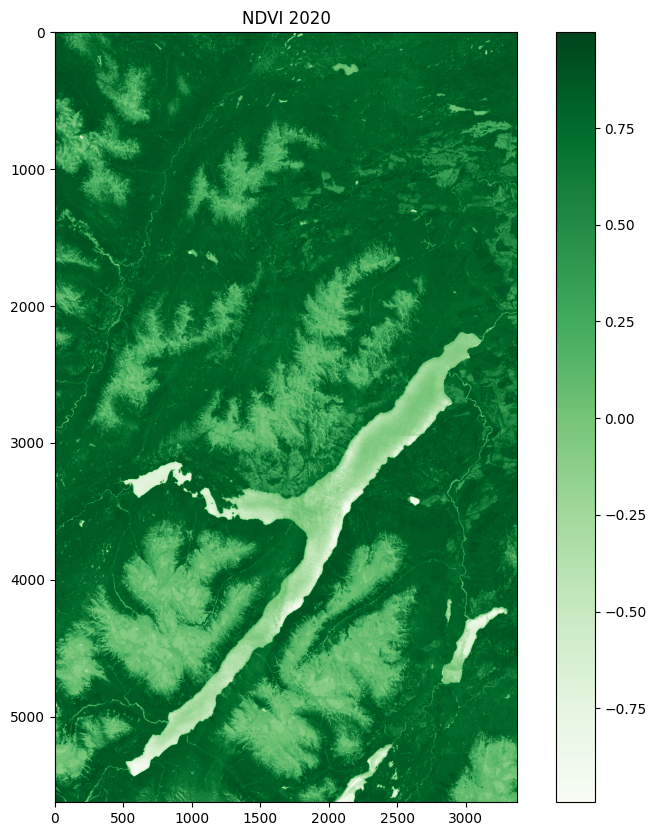

In [92]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(median_ndvi_2020, cmap='Greens')
ax.set_title("NDVI 2020")
fig.colorbar(cax)

In [94]:
ndvi_difference = median_ndvi_23 - median_ndvi_2020

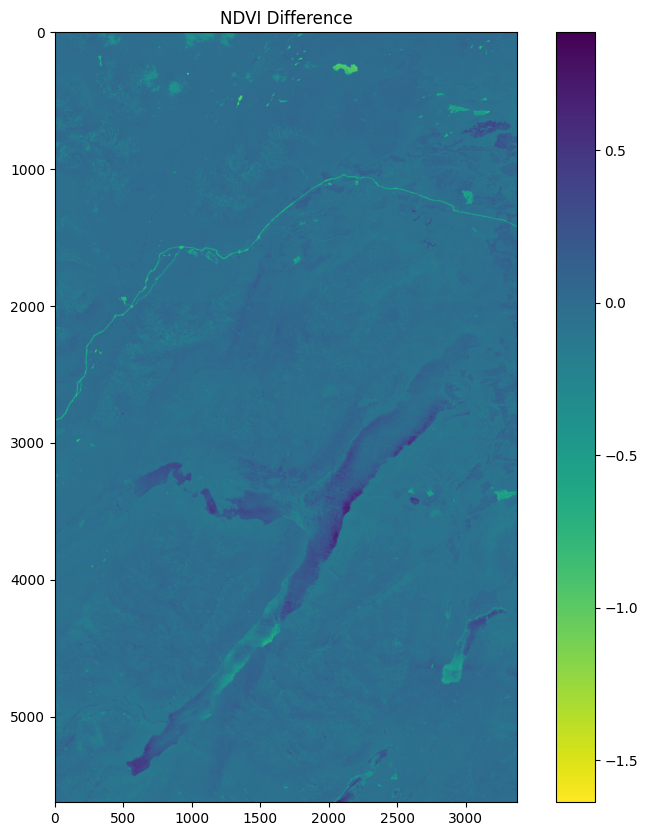

In [99]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(ndvi_difference, cmap='viridis_r')
ax.set_title("NDVI Difference")
fig.colorbar(cax)

In [6]:
from pystac_client import Client

catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

bbox = (-67.008753, -9.96445, -65.615556, -8.57408)

items = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,
    datetime="2019-06-01/2019-06-10"
).item_collection()

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/pystac_client/item_search.py:851: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


In [9]:
items

In [7]:
import geopandas as gpd
import shapely
import folium

gdf = gpd.GeoDataFrame.from_features(
    items.to_dict(), 
    crs="EPSG:4326"
)
bbox_geom = shapely.geometry.mapping(shapely.geometry.box(*bbox))
bbox_layer = folium.GeoJson(bbox_geom)

m = gdf.explore(column="eo:cloud_cover")
bbox_layer.add_to(m)
m

In [8]:
import stacmap

stacmap.explore(
    items, 
    prop="eo:cloud_cover", 
    bbox=bbox
)